# 18_BANKSY_style_SIMBA_niche_performance.ipynb

Plot contours, scatter pie and assess how well cells are positioned in embedding space that reflects niches.

In [1]:
%load_ext autoreload
%autoreload 2


import sys
sys.path.insert(1, '../scripts/benchmarking')

In [29]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from src.plot import plot_spatial, palette_celltype, plot_obs_spatial
import pandas as pd
import numpy as np
palette_entity_anno = palette_celltype.copy()
palette_entity_anno['gene_mean'] = "lightgray"
palette_entity_anno['gene'] = "gray"
from mpl_toolkits.axes_grid1 import make_axes_locatable
import anndata as ad
from scipy.sparse import csr_matrix

import os
import simba as si
si.__version__

workdir = 'data/18'
si.settings.set_workdir(workdir)

si.settings.set_figure_params(
    dpi=80,
    style='white',
    fig_size=[5,5],
    rc={'image.cmap': 'viridis'}
)

from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')

Saving results in: data/18


# Data

In [7]:
adata_fn = "/data/pinello/PROJECTS/2025-01-31_CC_Spatial_SIMBA/SIMBA_in_space/data/human_DLPFC/151507.h5ad"
adata_CG = sc.read_h5ad(adata_fn)

In [3]:
local_adata_C = sc.read_h5ad(f"data/12/local_adata_C.h5ad")
local_adata_G = sc.read_h5ad(f"data/12/local_adata_G.h5ad")
local_adata_G.obs['gene_type'] = ['gene_mean' if '_mean' in g else 'gene' for g in local_adata_G.obs.index]
local_adata_G.obs['original_gene'] = [g.split("_mean")[0] for g in local_adata_G.obs.index]

In [4]:
local_adata_all = si.tl.embed(adata_ref=local_adata_C,list_adata_query=[local_adata_G])
local_adata_all.obs.head()

Performing softmax transformation for query data 0;


,spatialLIBD,id_dataset,gene_type,original_gene
AATATCGAGGGTTCTC-1,L1,ref,NaN,NaN
GATTCGACGGTTCACG-1,L3,ref,NaN,NaN
ACGCGCTACACAGGGT-1,L5,ref,NaN,NaN
GCCTGCTACACTGAGA-1,L1,ref,NaN,NaN
CCCATATAGGTCGATT-1,L5,ref,NaN,NaN


In [5]:
local_adata_all.obs['entity_anno'] = ""
local_adata_all.obs.loc[local_adata_C.obs_names, 'entity_anno'] = local_adata_all.obs.loc[local_adata_C.obs_names, 'spatialLIBD']
local_adata_all.obs.loc[local_adata_G.obs_names, 'entity_anno'] = local_adata_G.obs['gene_type']
local_adata_all.obs.head()

,spatialLIBD,id_dataset,gene_type,original_gene,entity_anno
AATATCGAGGGTTCTC-1,L1,ref,NaN,NaN,L1
GATTCGACGGTTCACG-1,L3,ref,NaN,NaN,L3
ACGCGCTACACAGGGT-1,L5,ref,NaN,NaN,L5
GCCTGCTACACTGAGA-1,L1,ref,NaN,NaN,L1
CCCATATAGGTCGATT-1,L5,ref,NaN,NaN,L5


In [14]:
adata_cmp = si.tl.compare_entities(adata_ref=local_adata_C, adata_query=local_adata_G)
adata_cmp

AnnData object with n_obs × n_vars = 4221 × 31636
    obs: 'spatialLIBD'
    var: 'gene_type', 'original_gene', 'max', 'std', 'gini', 'entropy'
    layers: 'norm', 'softmax'

In [16]:
adata_cmp.layers['softmax'].shape

(4221, 31636)

In [17]:
df_softmax_CG = pd.DataFrame(data=adata_cmp.layers['softmax'], index=adata_cmp.obs.index, columns=adata_cmp.var.index)

# Contours

In [37]:
import umap
trans = umap.UMAP(n_neighbors=15, random_state=42).fit(local_adata_C.X)

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [38]:
# Use the learned umap to transform the features
subset = local_adata_all[local_adata_all.obs['id_dataset']!='ref'] ## here adata_CPG is constructed with si.tl.embed() with all cells as reference and peak & gene as 
features = pd.DataFrame(subset.X,index=subset.obs.index)
test_embedding = trans.transform(features)
test_embedding = pd.DataFrame(test_embedding,index=features.index,columns=['umap1','umap2'])

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [78]:
gene_list = ['CCK', 'FABP7', 'PVALB', 'ADAM9']

In [79]:
# now for example we want to visualize for the gene BSG and the peak 'chr19_12784405_12785265'
top_genecell_umaps = {}
for gene in gene_list:
    top_genecell_umaps[gene] = {}
    for suffix in ['', '_mean_mean']:
        gene_suffix = f'{gene}{suffix}'
        cell_umap = pd.DataFrame(trans.embedding_,index=local_adata_C.obs.index,columns=['umap1','umap2'])
        cell_scores = df_softmax_CG.T.loc[gene_suffix]
        threshold = cell_scores.quantile(0.9)
        top_cells = cell_scores[cell_scores > threshold]
        top_genecell_umap = cell_umap.loc[top_cells.index]
        top_genecell_umaps[gene][gene_suffix] = top_genecell_umap.copy()

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines
from scipy.stats import gaussian_kde

# Set publication-quality figure settings
plt.rcParams['pdf.fonttype'] = 42  # Ensure editable fonts in PDF
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['figure.dpi'] = 300

def plot_umap_with_contours(
    embedding, labels, highlight_points, label_to_color, top_genecell_umaps, figsize=(14, 6),
    title="UMAP Contour Visualization", pdf_path="umap_contour_plot.pdf"
):
    """
    Creates a UMAP scatter plot with density contours for peaks and genes, displayed in two subplots.

    Parameters:
        embedding (ndarray): Array of shape (n_samples, 2) for UMAP embeddings.
        labels (list): List of cell type labels corresponding to the points.
        highlight_points (dict): Dictionary of points to highlight with colors.
        label_to_color (dict): Mapping of cell type labels to colors.
        top_variantcell_umap (DataFrame): Data containing coordinates for peak (variant) contour plotting.
        top_genecell_umap (DataFrame): Data containing coordinates for gene contour plotting. Dictionary of dictionaries
            {'gene': {'gene': df, 'gene_mean': df}}
        title (str): Title of the plot.
        pdf_path (str): File path to save the plot as a PDF.
    """

    for gene, top_genecell_umap_dict in top_genecell_umaps.items():
        # Create subplots with 2 columns (1 row, 2 columns)
        fig, axes = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)
        flat_axes = axes.flatten()

        # Function to plot KDE contours
        def plot_contours(ax, data, color, alpha, label):
            umap_x = data['umap1']
            umap_y = data['umap2']
            kde = gaussian_kde([umap_x, umap_y])
            x_min, x_max = umap_x.min() - 3, umap_x.max() + 3
            y_min, y_max = umap_y.min() - 3, umap_y.max() + 3
            x_grid, y_grid = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
            z_grid = kde(np.vstack([x_grid.flatten(), y_grid.flatten()]))
            ax.contour(x_grid, y_grid, z_grid.reshape(x_grid.shape), levels=10, colors=color, alpha=alpha)
            ax.set_title(label, fontsize=14, fontweight="bold")

        # Scatter plot of all cells
        def scatter_cells(ax):
            colors_mapped = [label_to_color[label] for label in labels]
            ax.scatter(
                embedding[:, 0], embedding[:, 1],
                c=colors_mapped, s=10, alpha=0.6, edgecolors='none'
            )

        # # **First Subplot: Peak (Variant) Contour**
        # scatter_cells(axes[0])
        # plot_contours(axes[0], top_variantcell_umap, color='red', alpha=0.5, label="chr19-555694-556592")

        # **Second Subplot: Gene Contour**
        i = 0
        for label, top_genecell_umap in top_genecell_umap_dict.items():
            scatter_cells(flat_axes[i])
            plot_contours(flat_axes[i], top_genecell_umap, color='blue', alpha=0.5, label=label)
            i += 1

        # Highlight specific points in both subplots
        #for ax in axes:
        #   for name, (x, y, color) in highlight_points.items():
        #      ax.scatter(x, y, color=color, s=80, label=name, edgecolor="black", linewidth=0.8)
        #     ax.text(x + 0.5, y + 0.5, name, fontsize=10, color=color, fontweight="bold")

        # Add common labels
        fig.suptitle(gene, fontsize=16, fontweight="bold", y=1.02)
        for ax in flat_axes:
            ax.set_xlabel("UMAP1", fontsize=14)
            ax.set_ylabel("UMAP2", fontsize=14)
            ax.grid(alpha=0.3)

        # Create a legend for cell types
        handles = [
            mlines.Line2D([], [], color=color, marker='o', linestyle='None',
                        markersize=8, label=label)
            for label, color in label_to_color.items()
        ]
        #handles.append(mlines.Line2D([], [], color="black", marker='*', linestyle='None', markersize=8, label="Peak"))

        flat_axes[1].legend(handles=handles, title="Cell Type", bbox_to_anchor=(1.05, 1),
                    frameon=False, loc='upper left', labelspacing=1.4, fontsize=10)

        # Adjust layout and save as PDF
        plt.tight_layout()
        # plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

        plt.show()

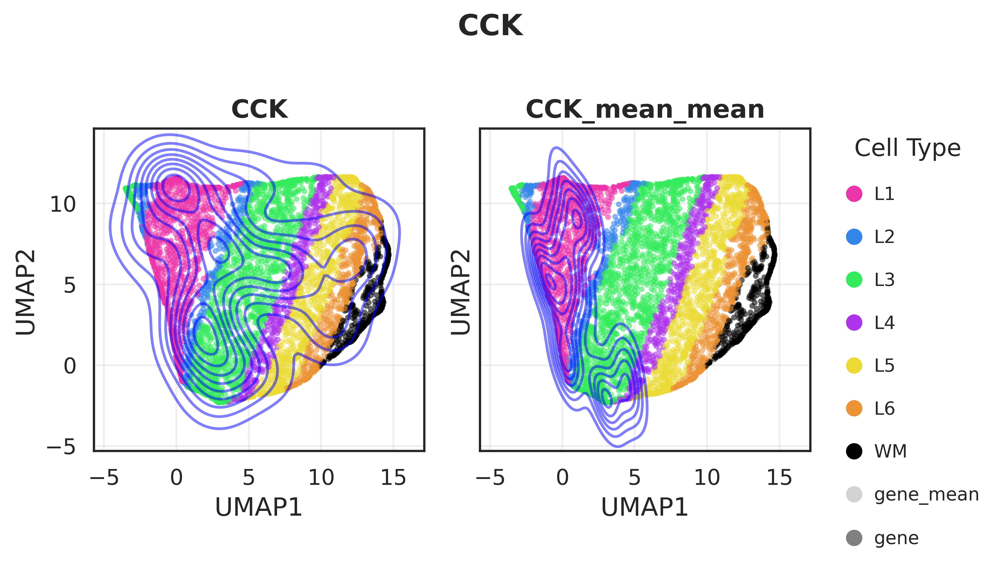

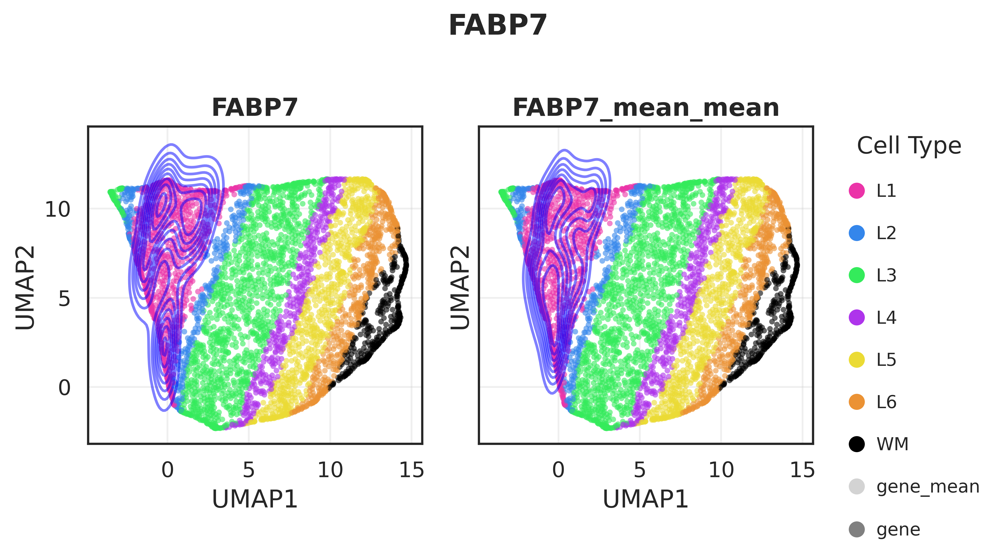

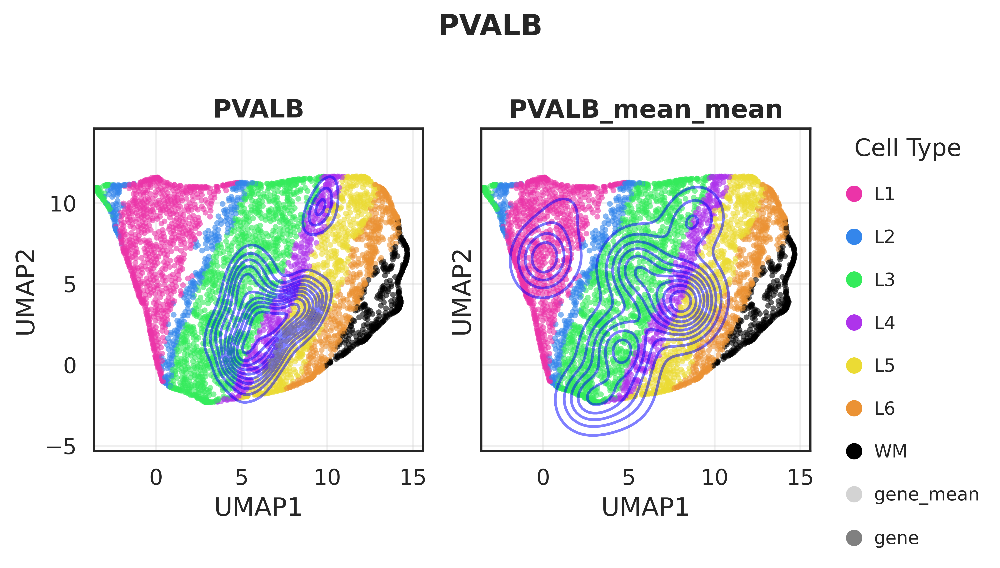

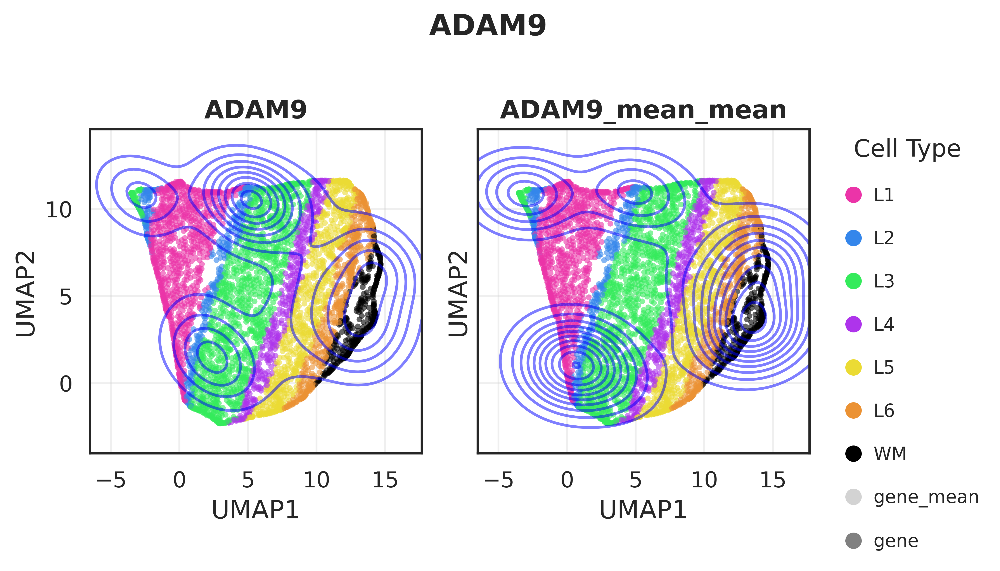

In [84]:
# Call the function
plot_umap_with_contours(
    embedding=trans.embedding_,
    labels=local_adata_C.obs['spatialLIBD'].tolist(),
    highlight_points=None,
    label_to_color=palette_entity_anno,
    top_genecell_umaps=top_genecell_umaps,  # Second subplot: Gene Contour
    figsize=(8, 4)
)

# Scatter pie

From here: https://stackoverflow.com/a/56338575

In [152]:
import umap
trans2 = umap.UMAP(n_neighbors=10, random_state=42).fit(local_adata_C.X)
cell_umap2 = pd.DataFrame(trans2.embedding_,index=local_adata_C.obs.index,columns=['umap1','umap2'])

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [157]:
def draw_pie(dist, 
             xpos, 
             ypos, 
             size, 
             colors,
             ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,8))

    # for incremental pie slices
    non_zero_dist = dist[dist > 0]
    cumsum = np.cumsum(non_zero_dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()

    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])

        label = non_zero_dist.index[i]
        ax.scatter([xpos], [ypos], marker=xy, s=size, facecolor=colors[label], linewidths=0.1, edgecolors='k')
        i += 1
    
    return ax

In [101]:
from scipy.spatial import cKDTree
coords = adata_CG.obsm['spatial']
tree = cKDTree(coords)

k=6
# Query the k+1 nearest neighbors (to exclude the point itself)
distances, indices = tree.query(coords, k=k+1)
# Exclude self (first column)
indices = indices[:, 1:]
indices_df = pd.DataFrame(indices, index=adata_CG.obs.index, columns=np.arange(1, k + 1))

In [102]:
indices_df.head()

,1,2,3,4,5,6
AAACAACGAATAGTTC-1,3165,1084,1337,2804,4039,3710
AAACAAGTATCTCCCA-1,1202,4110,453,2429,2687,549
AAACAATCTACTAGCA-1,3334,1706,786,2509,2694,1853
AAACACCAATAACTGC-1,2623,3851,2111,663,3510,2926
AAACAGCTTTCAGAAG-1,2063,2199,508,1474,3307,1375


In [103]:
adata_CG.obs.loc[adata_CG.obs.index[indices_df.iloc[0]]]['spatialLIBD'].value_counts()

spatialLIBD
L1    4
L2    2
L3    0
L4    0
L5    0
L6    0
WM    0
Name: count, dtype: int64

/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as pos

/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as pos

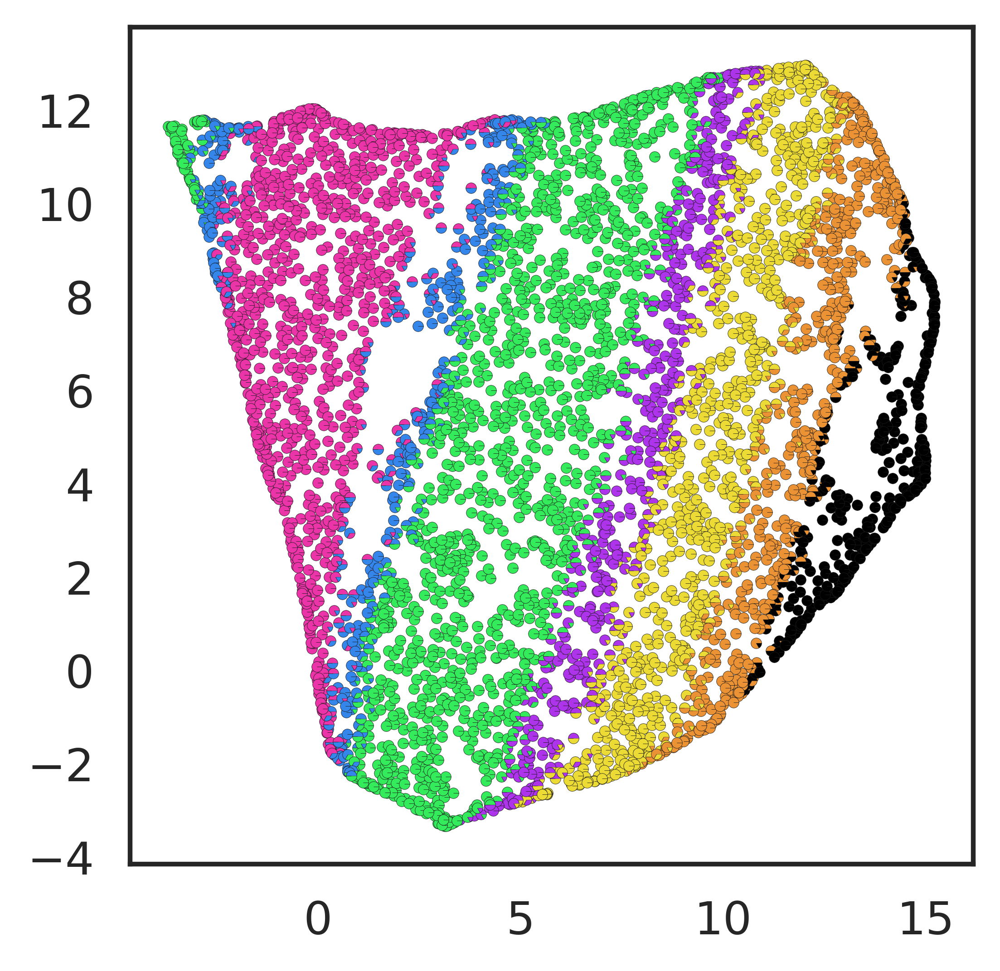

In [159]:
fig, ax = plt.subplots(figsize=(4,4))

for cell, r in cell_umap2.iterrows():
    k_neighbors = indices_df.loc[cell].to_numpy()
    dist = adata_CG.obs.loc[adata_CG.obs.index[k_neighbors]]['spatialLIBD'].value_counts()
    draw_pie(dist, 
             r['umap1'], 
             r['umap2'], 
             size=8, 
             colors=palette_celltype,
             ax=ax)
    
plt.show()

In [162]:
sc.tl.pca(local_adata_C)

In [167]:
cell_pca = pd.DataFrame(local_adata_C.obsm['X_pca'], index=local_adata_C.obs.index, columns=np.arange(1, local_adata_C.obsm['X_pca'].shape[1] + 1))

In [168]:
cell_pca

,1,2,3,4,5,6,7,8,9,10,...,40,41,42,43,44,45,46,47,48,49
AATATCGAGGGTTCTC-1,0.185294,-0.582657,0.467475,0.435579,-0.344320,0.195835,-0.140580,0.250044,-0.372821,-0.390484,...,0.022162,0.134557,0.092482,0.179129,-0.181706,0.058196,3.275992e-02,0.264310,-0.075608,0.492616
GATTCGACGGTTCACG-1,-0.424648,-0.191380,-0.340980,0.056732,0.115764,0.010506,0.017159,0.249886,-0.280272,-0.104247,...,-0.139081,0.114933,-0.134264,-0.047514,-0.074006,-0.334125,-4.717717e-01,0.278053,-0.388471,0.298465
ACGCGCTACACAGGGT-1,-0.533831,0.282671,-0.067256,-0.069509,0.132008,-0.160486,0.260156,-0.614668,-0.049283,-0.336273,...,0.261582,0.015458,0.376655,0.339834,-0.154699,0.330921,-3.758630e-02,-0.516979,-0.120287,0.089499
GCCTGCTACACTGAGA-1,-0.086848,-0.128579,0.720944,0.072440,-0.071629,0.182865,-0.125880,-0.340741,0.336363,0.517492,...,-0.036609,-0.210577,0.100125,0.207458,-0.266272,-0.175609,2.243999e-01,0.226001,0.285518,0.342244
CCCATATAGGTCGATT-1,-0.427613,0.341630,0.033126,-0.039372,-0.003479,-0.354983,0.066403,-0.003998,0.348058,-0.049394,...,0.663353,-0.573660,-0.385805,-0.503300,-0.094452,-0.016746,3.549208e-01,0.316640,0.085335,-0.165673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGATACCGGTGTTCAC-1,-0.525104,0.176684,-0.081494,-0.129502,0.166884,-0.080618,0.038866,-0.408128,0.049870,-0.219451,...,-0.202415,-0.310415,0.155366,-0.370879,0.099326,0.225491,5.163276e-07,-0.200715,-0.254135,0.012009
GAGGCCTGTTGATACA-1,-0.607015,0.256674,0.308485,-0.018639,0.007419,-0.255509,-0.279310,-0.071037,0.393040,0.056449,...,0.492166,-0.443549,-0.358827,-0.225215,-0.025302,-0.139842,-2.033296e-01,0.191451,-0.219410,-0.225375
TCTTACGGCATCCGAC-1,-0.236733,-0.076369,-0.381353,0.033683,-0.048253,-0.099913,0.122649,-0.098773,0.089227,0.211160,...,0.180659,0.315402,-0.163910,-0.275274,-0.581167,0.017203,-1.284125e-01,-0.370814,0.317550,-0.012666
CACGTTTCGTACACAC-1,-0.601269,0.108782,0.254473,0.033817,-0.030728,-0.218043,-0.386697,-0.106826,0.248364,0.327536,...,-0.109567,0.301653,0.400394,0.148450,0.270522,0.081564,-5.396789e-01,-0.178629,0.040385,0.051384


/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cumsum = cumsum/ cumsum[-1]
/tmp/ipykernel_1614679/128420098.py:13: FutureWarning: Series.__getitem__ treating keys as pos

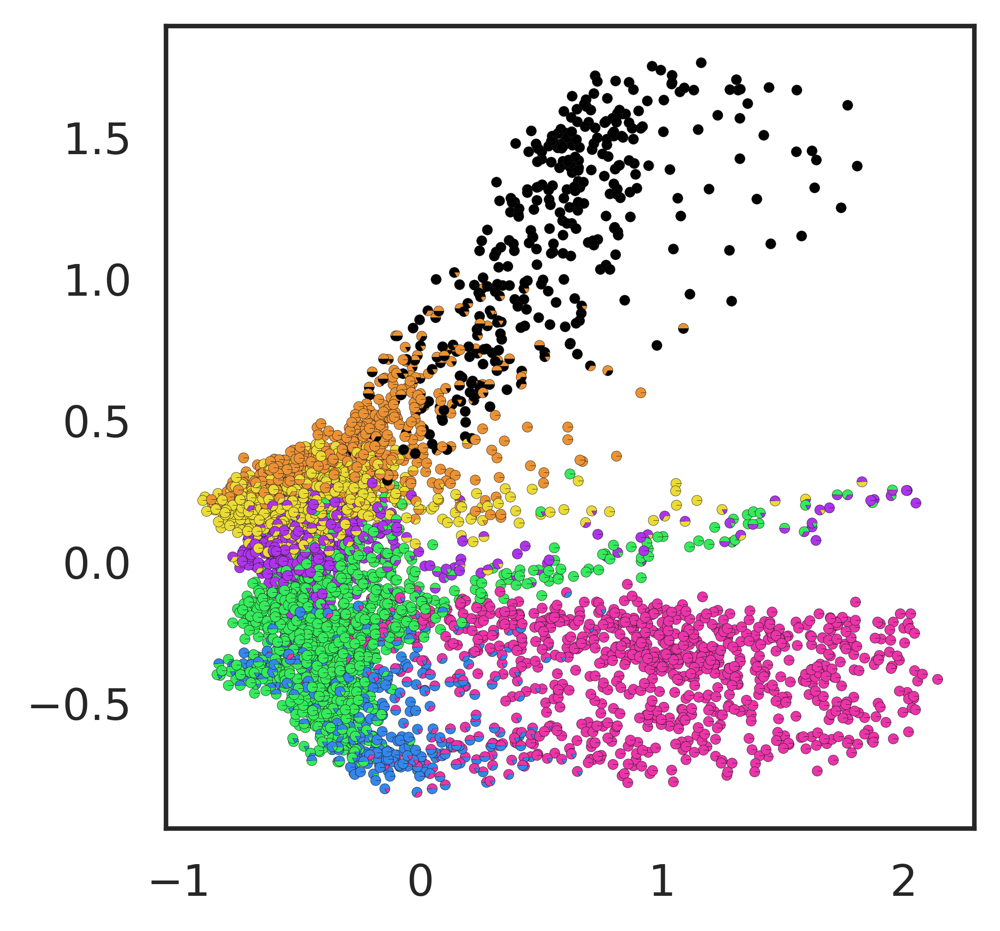

In [169]:
fig, ax = plt.subplots(figsize=(4,4))

for cell, r in cell_pca.iterrows():
    k_neighbors = indices_df.loc[cell].to_numpy()
    dist = adata_CG.obs.loc[adata_CG.obs.index[k_neighbors]]['spatialLIBD'].value_counts()
    draw_pie(dist, 
             r[1], 
             r[2], 
             size=8, 
             colors=palette_celltype,
             ax=ax)
    
plt.show()

Cosine similarity vs neighborhood labels distribution